# 8.7 练习10

使用t-SNE将MNIST数据集降至两个维度，然后用Matplotlib绘制结果。你可以通过散点图用10个不同的颜色来代表每个图像的目标类，或者也可以用对应实例的类（从0到9的数字）替换散点图中的每个点，甚至你还可以绘制数字图像本身的缩小版（如果你绘制所有数字，视觉效果会太凌乱，所以你要么绘制一个随机样本，要么选择单个实例，但是这个实例的周围最好没有其他绘制的实例）。现在你应该得到了一个很好的可视化结果及各自分开的数字集群。尝试使用其他降维算法，如PCA、LLE或MDS等，比较可视化结果。

In [1]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import fetch_openml

In [2]:
mnist = fetch_openml("mnist_784", version=1, as_frame=False)
mnist.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

In [3]:
np.random.seed(42)

m=10000
idx = np.random.permutation(60000)[:m]

X = mnist['data'][idx]
y = mnist['target'][idx]

使用t-SNE将降维到2D

In [4]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_reduced = tsne.fit_transform(X)

In [5]:
X_reduced.shape

(10000, 2)

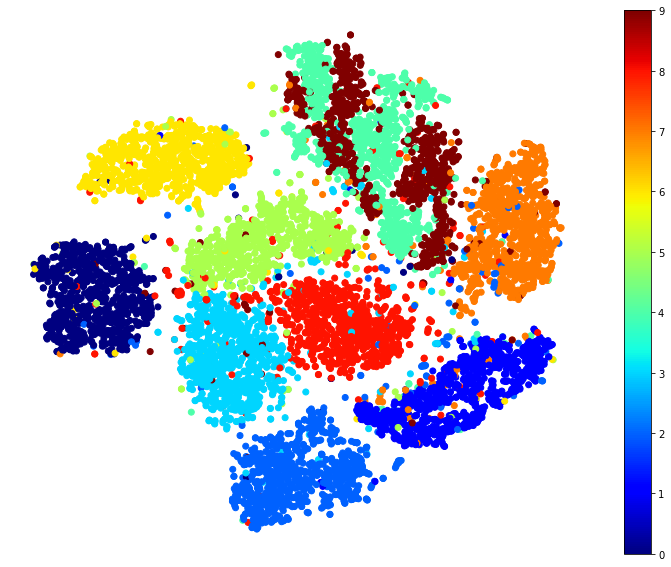

In [6]:
plt.figure(figsize=(13, 10))
y = y.astype(np.uint8)
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap="jet")
plt.axis('off')
plt.colorbar()
plt.show()

上面的图是不是很漂亮？:）这个图告诉了哪些数字是很容易和其他的数字区别开的（0， 6， 8很容易于其他的数字区别开）；哪些数字是不容易与其他的数字区别的（4和9重叠，5和3重叠）

下面我们集中有2， 3， 5， 这几个看起来重叠很多的数字

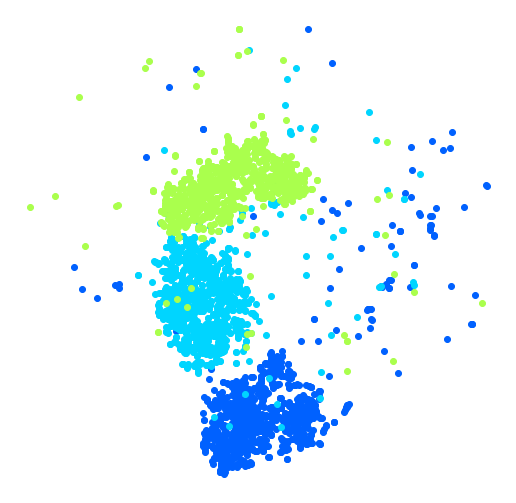

In [7]:
plt.figure(figsize=(9, 9))
cmap = mpl.cm.get_cmap("jet")

for digit in (2, 3, 5):
    plt.scatter(X_reduced[y==digit, 0], X_reduced[y==digit, 1], c=[cmap(digit/9)])
plt.axis('off')
plt.show()

下面我们使用t-SNE在这三个数字上获取一个更好看的图像


In [8]:
idx = (y==2) | (y==3) | (y==5)
X_subset = X[idx]
y_subset = y[idx]

tsne_subset = TSNE(n_components=2, random_state=42)
X_subset_reduced = tsne_subset.fit_transform(X_subset)

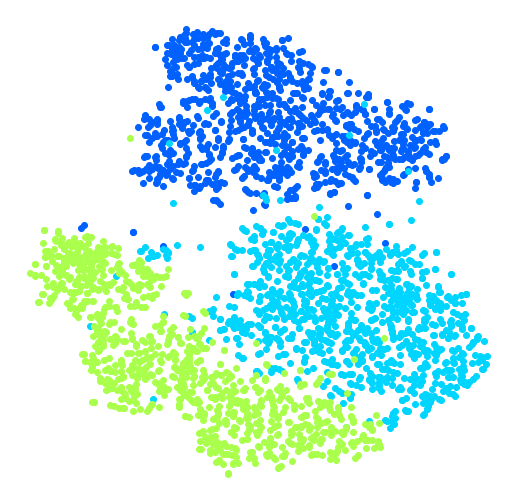

In [9]:
plt.figure(figsize=(9,9))
for digit in (2, 3, 5):
    plt.scatter(X_subset_reduced[y_subset == digit, 0], X_subset_reduced[y_subset == digit, 1], c=[cmap(digit/9)])

plt.axis('off')
plt.show()

现在看起来好很多了，簇也重叠了更少了。但是一些3与2和5还是有一些重叠了。而且有两个簇的2，和两个簇的5.如果我们在每个簇上面把数字显示出来看的会更加的明显。

In [10]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

def plot_digits(X, y, min_distance=0.05, images=None, figsize=(13, 10)):
    # 将输入特征缩放多0~1
    X_normalized = MinMaxScaler().fit_transform(X)
    # 创建一个坐标list由于存储目前绘制的数字的坐标
    # 假设一开始绘制的就很远，以防下面的'if'循环
    neighbors = np.array([[10., 10.]])
    plt.figure(figsize=figsize)
    cmap = mpl.cm.get_cmap("jet")
    digits = np.unique(y)
    for digit in digits:
        plt.scatter(X_normalized[y == digit, 0], X_normalized[y == digit, 1], c=[cmap(digit/9)])
    plt.axis("off")
    ax = plt.gcf().gca() # 获取当前figure中的axes
    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if images is None:
                plt.text(image_coord[0], image_coord[1], str(int(y[index])), color=cmap(y[index]/9), fontdict={"weight":"bold", "size":16})
            else:
                image = images[index].reshape(28, 28)
                imagebox = AnnotationBbox(OffsetImage(image, cmap="binary"), image_coord)
                ax.add_artist(imagebox)

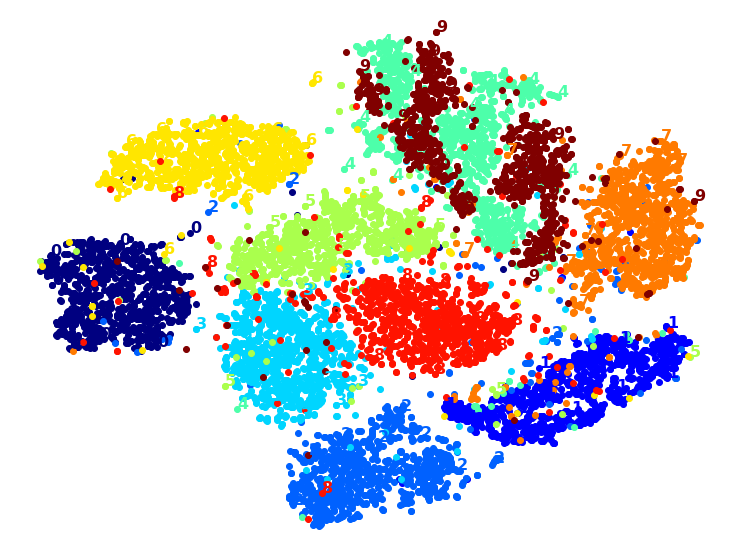

In [11]:
plot_digits(X_reduced, y)

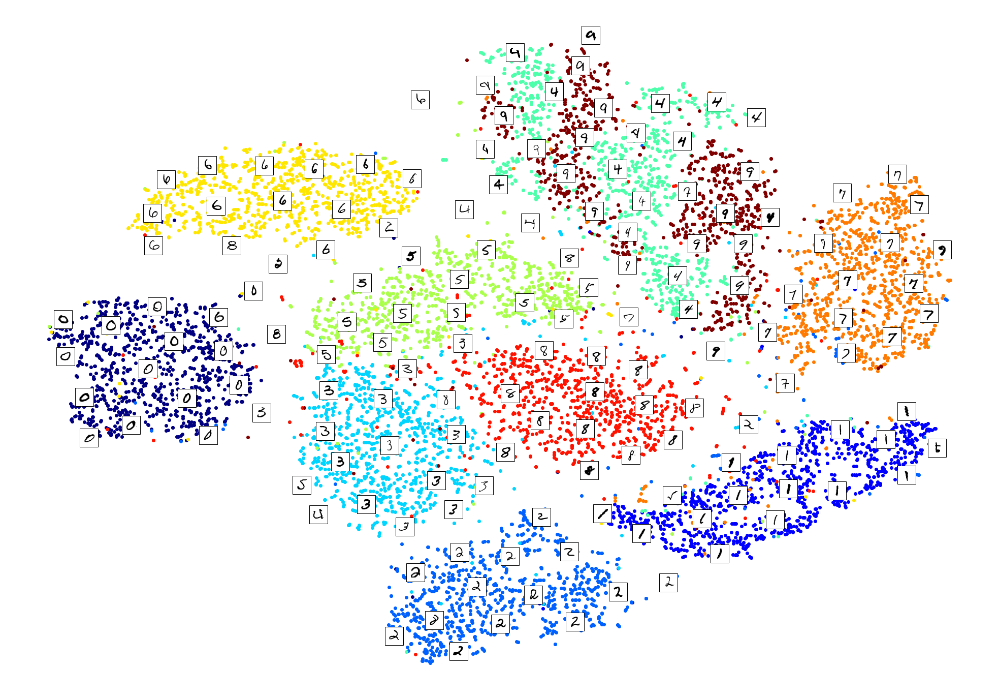

In [12]:
plot_digits(X_reduced, y, images=X, figsize=(35, 25))

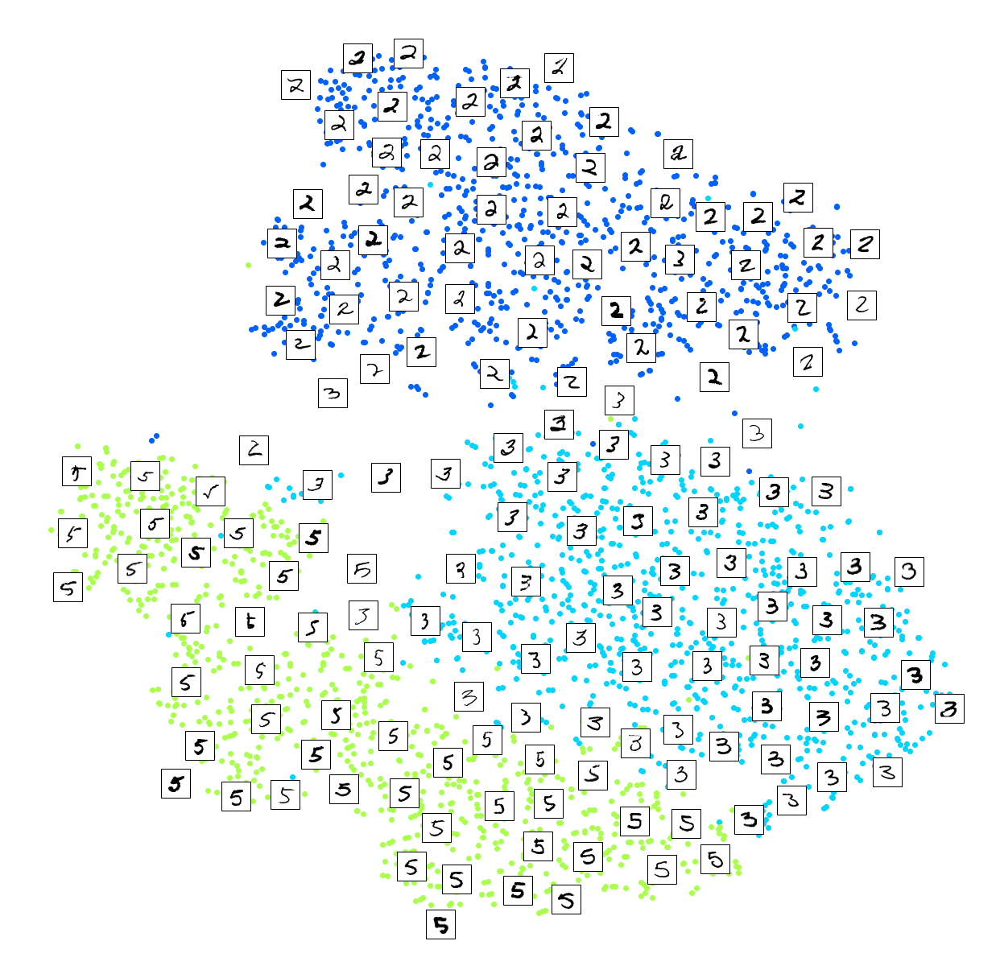

In [13]:
plot_digits(X_subset_reduced, y_subset, images=X_subset, figsize=(22, 22))

下面试试用其他的降维方法

PCA用时:0.4s


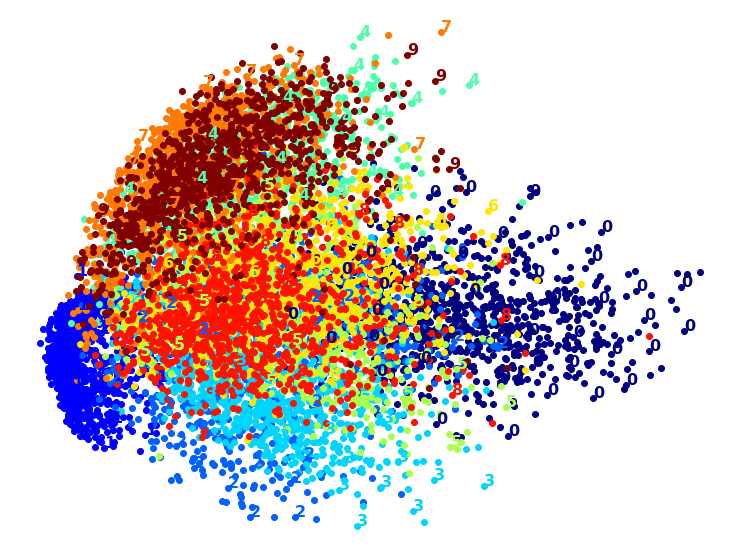

In [14]:
from sklearn.decomposition import PCA
import time

t0 = time.time()
X_pca_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
t1 = time.time()
print("PCA用时:{:.1f}s".format(t1 - t0))
plot_digits(X_pca_reduced, y, images=None)
plt.show()

PCA是很快，对结果一塌糊涂，下面试试LLE

LLE用时:137.5s


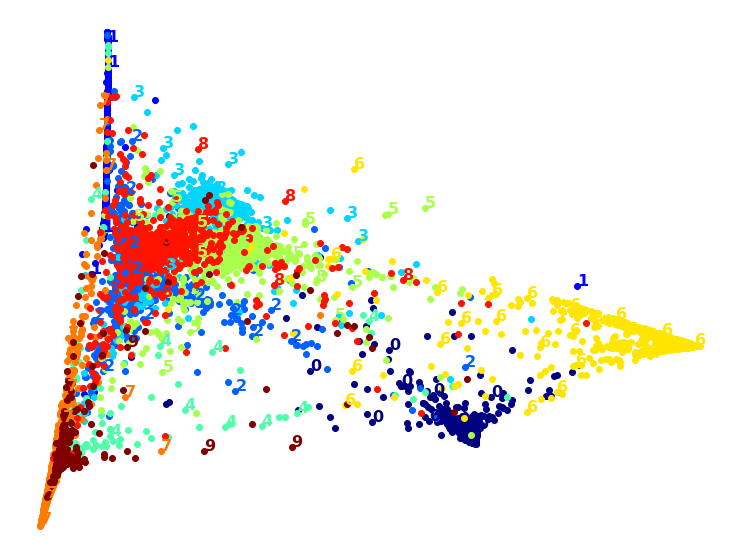

In [15]:
from sklearn.manifold import LocallyLinearEmbedding
import time

t0 = time.time()
X_lle_reduced = LocallyLinearEmbedding(n_components=2, random_state=42).fit_transform(X)
t1 = time.time()
print("LLE用时:{:.1f}s".format(t1 - t0))
plot_digits(X_lle_reduced, y)

LLE很慢，结果也不理想，下面将PCA+LLE来处理，将PCA的保留差异性设置为95%

PCA+LLE用时:50.4s


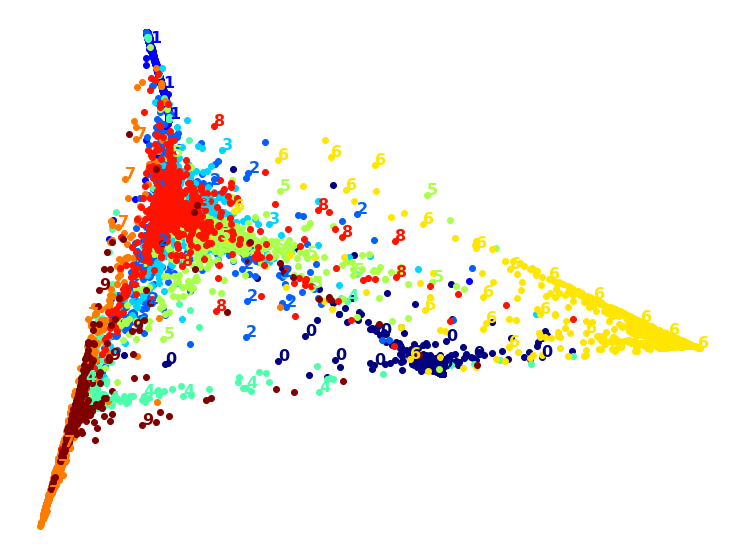

In [16]:
from sklearn.pipeline import Pipeline

pca_lle = Pipeline([
    ('pca', PCA(n_components=0.95, random_state=42)),
    ('lle', LocallyLinearEmbedding(n_components=2, random_state=42))
])

t0 = time.time()
X_pca_lle_reduced = pca_lle.fit_transform(X)
t1 = time.time()
print("PCA+LLE用时:{:.1f}s".format(t1 - t0))
plot_digits(X_pca_lle_reduced, y)


结果差不多，但是速度快了四倍！

下面试试MDS

mds耗时:5403.7s


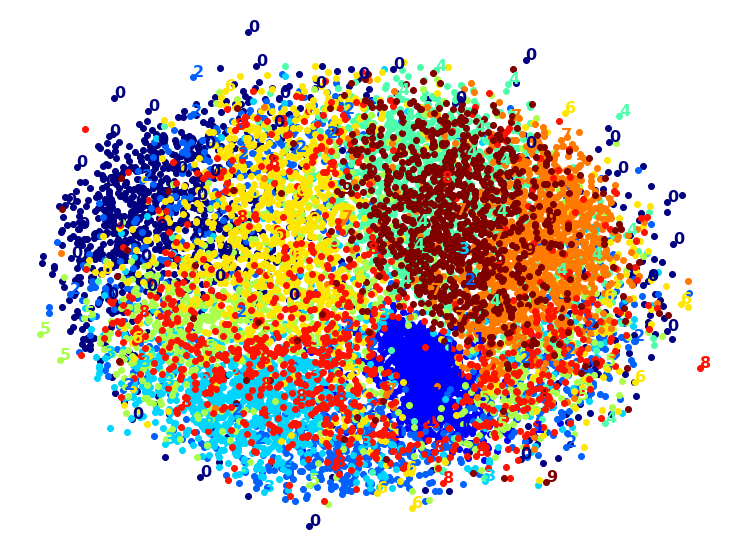

In [17]:
from sklearn.manifold import MDS

t0 = time.time()
X_mds_reduced = MDS(n_components=2, random_state=42).fit_transform(X)
t1 = time.time()
print("mds耗时:{:.1f}s".format(t1-t0))
plot_digits(X_mds_reduced, y)

这个依然不咋地，试试将PCA与MDS结合

pca+mds耗时:4790.5s


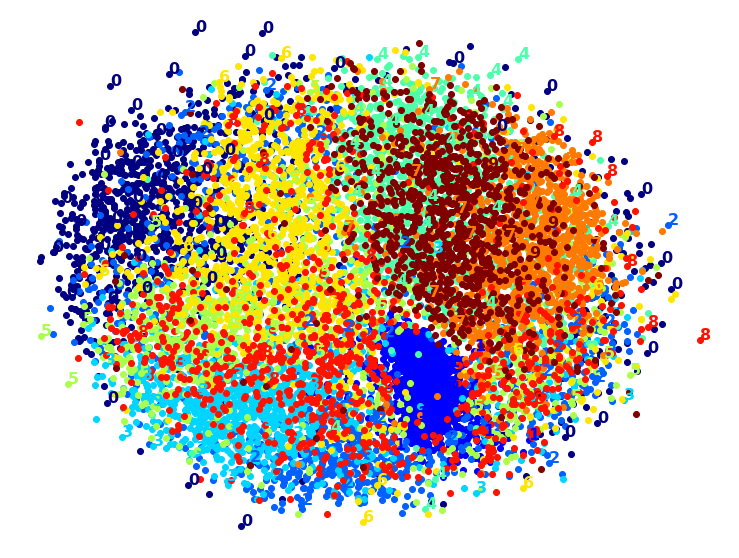

In [18]:
pca_mds = Pipeline([
    ("pca", PCA(n_components=0.95, random_state=42)),
    ("mds", MDS(n_components=2, random_state=42))
])

t0 = time.time()
X_pca_mds_reduced = pca_mds.fit_transform(X)
t1 = time.time()
print("pca+mds耗时:{:.1f}s".format(t1-t0))
plot_digits(X_pca_mds_reduced, y)

速度、结果差不多，PCA没有起到帮助，试试LDA

LDA耗时:2.0s


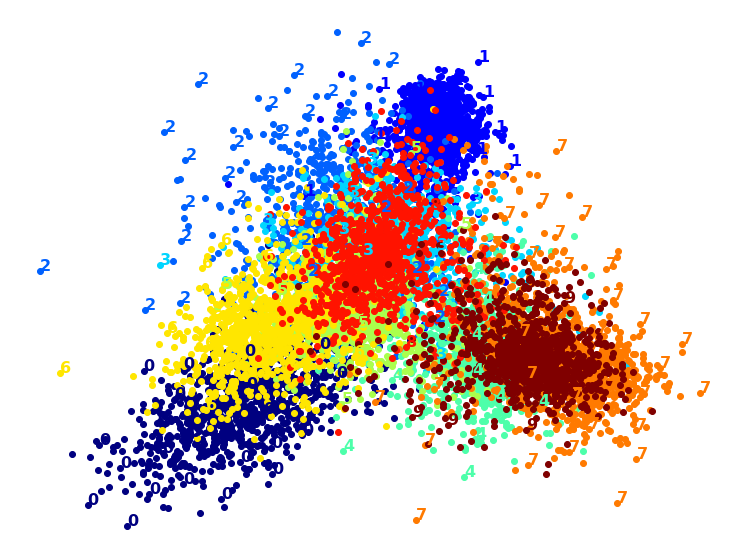

In [20]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

t0 = time.time()
X_lda_reduced = LinearDiscriminantAnalysis(n_components=2).fit_transform(X, y)
t1 = time.time()
print("LDA耗时:{:.1f}s".format(t1-t0))
plot_digits(X_lda_reduced, y)

LDA的速度很快，其结果看起来也不错，但是还是有一些簇重叠太厉害了。目前看来t-SNE的结果是最好的。

t-SNE 耗时 181.5s.


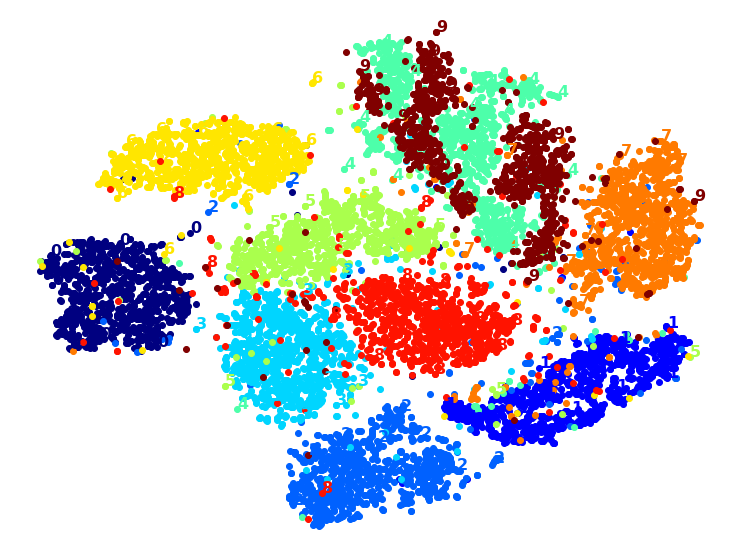

In [21]:
t0 = time.time()
X_tsne_reduced = TSNE(n_components=2, random_state=42).fit_transform(X)
t1 = time.time()
print("t-SNE 耗时 {:.1f}s.".format(t1 - t0))
plot_digits(X_tsne_reduced, y)

其速度比LLE慢了两倍，但是比MDS要快很多，其结果也是比较好的，我们看看使用PCA是否可以加速

PCA+TSNE耗时:98.4


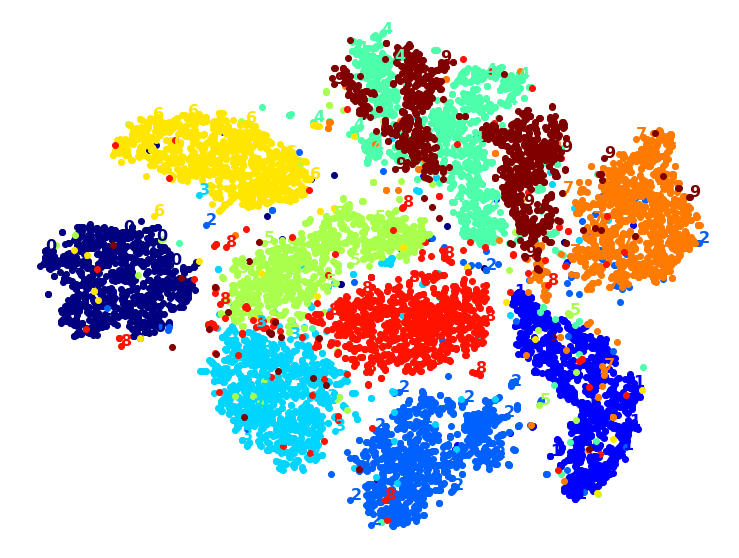

In [22]:
pca_tsne = Pipeline([
    ("pca", PCA(n_components=0.95, random_state=42)),
    ("tsne", TSNE(n_components=2, random_state=42))
])

t0 = time.time()
X_pca_tsne_reduced = pca_tsne.fit_transform(X)
t1 = time.time()
print("PCA+TSNE耗时:{:.1f}".format(t1 - t0))
plot_digits(X_pca_tsne_reduced, y)

PCA使得速度提升了两倍，但是结果没有变坏，所以最好的是PCA+TSNE